In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML

In [34]:
# import json
# with open('gdpData.json') as f:
#     data = json.load(f)

# cols = []
# for field in data['fields']:
#     print(field['label'])
#     cols.append(field['label'])

In [35]:
df = pd.DataFrame(data['data'],columns=cols)
df.head()

,Financial Year,Gross Domestic Product (in Rs. Cr) at 2004-05 Prices,Agriculture & Allied Services (in Rs. Cr.) at 2004-05 Prices,Agriculture (in Rs. Cr.) at 2004-05 Prices,Industry (in Rs. Cr.) at 2004-05 Prices,Mining and Quarrying (in Rs. Cr.) at 2004-05 Prices,Manufacturing (in Rs. Cr.) at 2004-05 Prices,Services (in Rs. Cr.) at 2004-05 Prices,Agri-culture & Allied Services -Share to Total GDP,Agriculture - Share to Total GDP,...,Mining and Quarrying - Share to Total GDP,Manufacturing - Share to Total GDP,Services - Share to Total GDP,Gross Domestic Product - % Growth Rate (YoY),Agri-culture & Allied Services - % Growth Rate (YoY),Agriculture - % Growth Rate (YoY),Industry - % Growth Rate (YoY),Mining and Quarrying - % Growth Rate (YoY),Manufacturing - % Growth Rate (YoY),Services - % Growth Rate (YoY)
0,1951-52,286147,147216,118877,47768,5772,25889,84799,5145,4154,...,202,905,2963,233,149,164,550,1233,316,267
1,1952-53,294267,151859,123822,47739,5905,26789,87438,5161,4208,...,201,910,2971,284,315,416,-006,231,348,311
2,1953-54,312177,163553,134958,50409,5993,28863,89940,5239,4323,...,192,925,2881,609,770,899,559,150,774,286
3,1954-55,325431,168361,138731,54574,6250,30885,94172,5173,4263,...,192,949,2894,425,294,280,826,428,701,471
4,1955-56,333766,166906,136679,60311,6348,33304,98845,5001,4095,...,190,998,2962,256,-086,-148,1051,158,783,496


In [36]:
df = pd.read_csv('../ngdp.csv')
df.head()

,Financial Year,Agriculture & Allied Services (in Rs. Cr.) at 2004-05 Prices,Agriculture (in Rs. Cr.) at 2004-05 Prices,Industry (in Rs. Cr.) at 2004-05 Prices,Mining and Quarrying (in Rs. Cr.) at 2004-05 Prices,Manufacturing (in Rs. Cr.) at 2004-05 Prices,Services (in Rs. Cr.) at 2004-05 Prices
0,1951-52,147216,118877,47768,5772,25889,84799
1,1951-52,147796,119495,47764,5788,26001,85128
2,1951-52,148376,120113,47760,5804,26113,85457
3,1951-52,148956,120731,47756,5820,26225,85786
4,1951-52,149536,121349,47752,5836,26337,86115


### Color, Labels

We'll user `colors` and `group_lk` to add color to the bars.

In [37]:
colors = dict(zip(
    ["Agriculture & Allied Services", "Agriculture", "Industry", "Mining & Quarrying", "Manufacturing", "Services"],
    
    ["#adb0ff", "#ffb3ff", "#90d595", "#e48381", "#aafbff", "#f7bb5f"]
))
names = dict(zip(
    [
     "Agriculture & Allied Services (in Rs. Cr.) at 2004-05 Prices",
     "Agriculture (in Rs. Cr.) at 2004-05 Prices",
     "Industry (in Rs. Cr.) at 2004-05 Prices",
     "Mining and Quarrying (in Rs. Cr.) at 2004-05 Prices",
     "Manufacturing (in Rs. Cr.) at 2004-05 Prices",
    "Services (in Rs. Cr.) at 2004-05 Prices"],
    ["Agriculture & Allied Services", "Agriculture", "Industry", "Mining & Quarrying", "Manufacturing", "Services"]
))

In [38]:
dff = df[df['Financial Year'] == '1952-53']


cols = [
     "Agriculture & Allied Services (in Rs. Cr.) at 2004-05 Prices",
     "Agriculture (in Rs. Cr.) at 2004-05 Prices",
     "Industry (in Rs. Cr.) at 2004-05 Prices",
     "Mining and Quarrying (in Rs. Cr.) at 2004-05 Prices",
     "Manufacturing (in Rs. Cr.) at 2004-05 Prices",
    "Services (in Rs. Cr.) at 2004-05 Prices"]

bar_names = ["Agriculture & Allied Services", "Agriculture", "Industry", "Mining & Quarrying", "Manufacturing", "Services"]

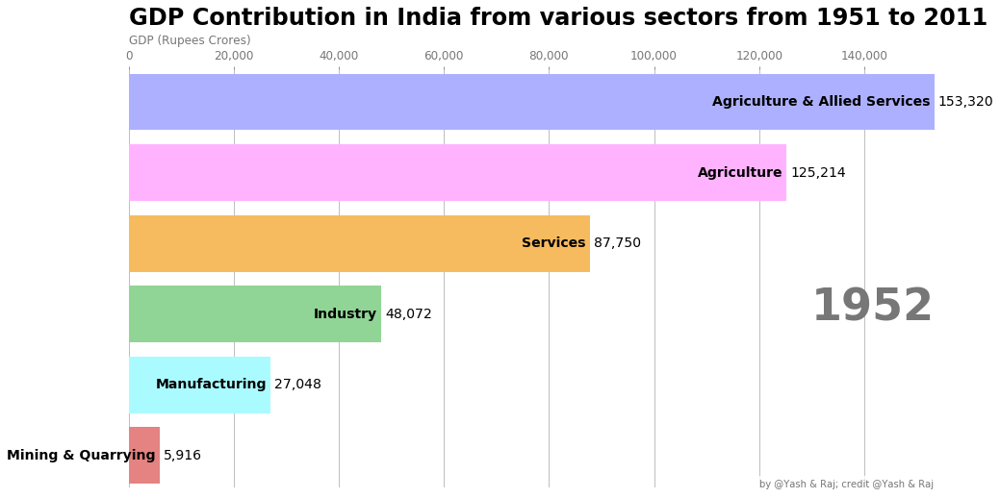

In [39]:
fig, ax = plt.subplots(figsize=(15, 8))
def draw_barchart(idx):
    dff = df.iloc[idx]
    fin_year = dff['Financial Year']
    
    values = [int(dff[c]) for c in cols]
    sorted_data = sorted(zip(values, bar_names), key=lambda x: x[0], reverse=False)
#     print(sorted_data)
    
    values = [s[0] for s in sorted_data]
    col = [s[1] for s in sorted_data]
    ax.clear()
    ax.barh(cols, values, color=[colors[x] for x in col])
    
    dx = max(values)/200
    for i, (value, name) in enumerate(zip(values, col)):
        ax.text(value-dx, i,     name,           size=14, weight=600, ha='right', va='center')
#         ax.text(value-dx, i-.25, name, size=10, color='#444444', ha='right', va='baseline')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
        
    ax.text(1, 0.4, fin_year.split('-')[0], transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'GDP (Rupees Crores)', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.15, 'GDP Contribution in India from various sectors from 1951 to 2011',
            transform=ax.transAxes, size=24, weight=600, ha='left', va='top')
    ax.text(1, 0, 'by @Yash & Raj; credit @Yash & Raj', transform=ax.transAxes, color='#777777', ha='right',
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
draw_barchart(10)



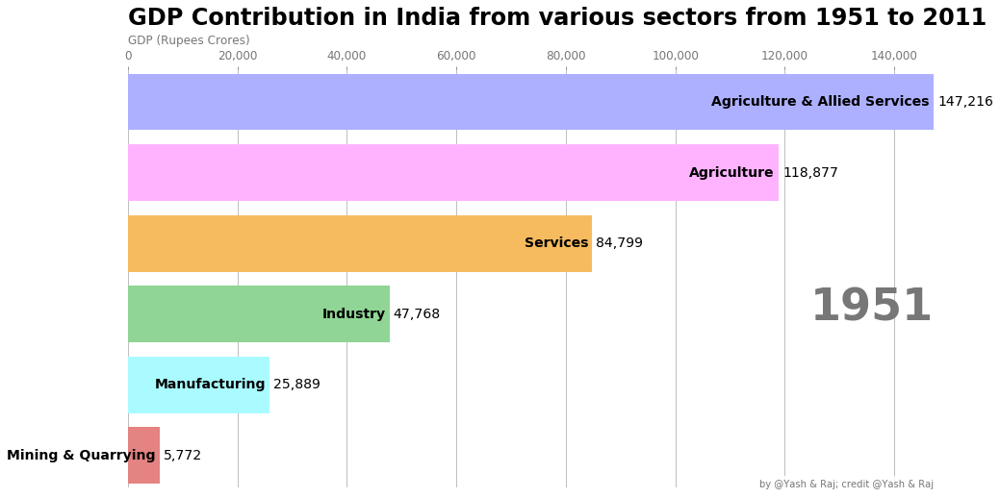

In [43]:
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=list(range(0, len(df), 2)))
HTML(animator.to_jshtml())
# or use animator.to_html5_video() or animator.save()

/Users/rajamohanreddybollavaram/opt/anaconda3/envs/py36/lib/python3.6/site-packages/matplotlib/__init__.py:886: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))


ValueError: Invalid file object: <_io.BufferedReader name=79>

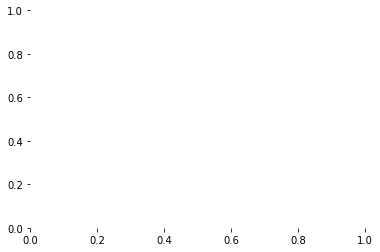

In [46]:
animator.save('gdp.gif')

ValueError: Invalid file object: <_io.BufferedReader name=78>

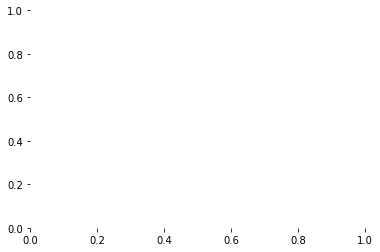

In [44]:
animator.to_html5_video('gdp.mp4')